# Basic Map

In [12]:
from ipyleaflet import Map

#map properties
center,zoom = (49.6252978589571, 8.34580993652344),8

#create map
basic_map = Map(center = center, zoom = zoom)

#display map #other options: display(basic_map)
basic_map

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

# Map Types

In [14]:
import ipywidgets
from ipyleaflet import Map, basemaps

radio_button = ipywidgets.RadioButtons(options=['Positron','DarkMatter','WorldstreetMap','DeLorme','WorldTopoMap','WorldImagery','NatGeoWorldMap','HikeBike','HyddaFull','Night','ModisTerra',
                                                'Mapnik','HOT','OpenTopoMap','Toner','Watercolor'], value = 'Positron', description='map types:')

def toggle_maps(map):
    if map == 'Positron': m = Map(zoom=zoom, center=center, basemap=basemaps.CartoDB.Positron)
    if map == 'DarkMatter': m = Map(zoom=zoom, center=center, basemap=basemaps.CartoDB.DarkMatter)
    if map == 'WorldstreetMap': m = Map(zoom=zoom, center=center, basemap=basemaps.Esri.WorldStreetMap)
    if map == 'DeLorme': m = Map(zoom=zoom, center=center, basemap=basemaps.Esri.DeLorme)
    if map == 'WorldTopoMap': m = Map(zoom=zoom, center=center, basemap=basemaps.Esri.WorldTopoMap)
    if map == 'WorldImagery': m = Map(zoom=zoom, center=center, basemap=basemaps.Esri.WorldImagery)
    if map == 'NatGeoWorldMap': m = Map(zoom=zoom, center=center, basemap=basemaps.Esri.NatGeoWorldMap)
    if map == 'HikeBike': m = Map(zoom=zoom, center=center, basemap=basemaps.HikeBike.HikeBike)
    if map == 'HyddaFull': m = Map(zoom=zoom, center=center, basemap=basemaps.Hydda.Full)
    if map == 'Night': m = Map(zoom=zoom, center=center, basemap=basemaps.NASAGIBS.ViirsEarthAtNight2012)
    if map == 'ModisTerra': m = Map(zoom=zoom, center=center, basemap=basemaps.NASAGIBS.ModisTerraTrueColorCR)
    if map == 'Mapnik': m = Map(zoom=zoom, center=center, basemap=basemaps.OpenStreetMap.Mapnik)
    if map == 'HOT': m = Map(zoom=zoom, center=center, basemap=basemaps.OpenStreetMap.HOT)
    if map == 'OpenTopoMap': m = Map(zoom=zoom, center=center, basemap=basemaps.OpenTopoMap)
    if map == 'Toner': m = Map(zoom=zoom, center=center, basemap=basemaps.Stamen.Toner)
    if map == 'Watercolor': m = Map(zoom = zoom, center = center, basemap=basemaps.Stamen.Watercolor)
    display(m)

ipywidgets.interact(toggle_maps, map=radio_button)

interactive(children=(RadioButtons(description='map types:', options=('Positron', 'DarkMatter', 'WorldstreetMa…

<function __main__.toggle_maps(map)>

# Marker

In [20]:
from ipyleaflet import Map, Marker
import geocoder

#location Adress
location = geocoder.osm('Riedstadt, Germany, Hesse')

#view location details
location.json

#latitude and lonitude of location
latlng = [location.lat, location.lng]
#create map
map = Map(center=center, zoom=zoom, basemap=basemaps.Esri.NatGeoWorldMap)

#Marker
marker = Marker(location=latlng, title='Riedstadt')
map.add_layer(marker) #Add Marker to map

#display map
map

Map(basemap={'url': 'http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{…

# GeoJSON display

In [141]:
import shapefile

#Load shape file
hessisches_ried = shapefile.Reader(r'C:\Users\USER\Desktop\Masterarbeit\DATA\master_data\Ried_225_222\hessisches_ried')

#Geometry
shapes_ried = hessisches_ried.shapes()

#Convert to GeoJSON
geoj_ried = shapes_ried.__geo_interface__

In [142]:
from ipyleaflet import Map, GeoJSON
import json

map = Map(zoom = zoom, center = center, basemap = basemaps.Esri.NatGeoWorldMap)

#create polygon to display
polygon_ried = GeoJSON(data=geoj_ried)

#add polygon to map
map.add_layer(polygon_ried)

#display map
display(map)

Map(basemap={'url': 'http://server.arcgisonline.com/ArcGIS/rest/services/NatGeo_World_Map/MapServer/tile/{z}/{…

# Time Series Dashboard
https://towardsdatascience.com/how-to-build-a-time-series-dashboard-in-python-with-panel-altair-and-a-jupyter-notebook-c0ed40f02289

In [46]:
import pandas as pd
#Load Datasets
soil_moisture_asc = pd.read_csv(r'C:\Users\USER\Desktop\master-thesis-master\sm_s1_des_250_ried_clc.csv') #Load from CSV file
soil_moisture_asc = soil_moisture_asc.drop(['geometry'], axis=1) #Delete invalid Geometry column
soil_moisture_asc.rename(columns={'Unnamed: 0':'Feature'}, inplace=True) #rename column 
soil_moisture_asc.rename(columns={'first':'Soil Class'}, inplace=True) #rename column 
soil_moisture_asc.index = soil_moisture_asc['date']
del soil_moisture_asc['date']
soil_moisture_asc_small = soil_moisture_asc[(soil_moisture_asc['Feature'] >= 1) & (soil_moisture_asc['Feature'] <=30 )]
soil_moisture_asc_grouped = soil_moisture_asc.groupby('Soil Class')
soil_moisture_asc_grouped



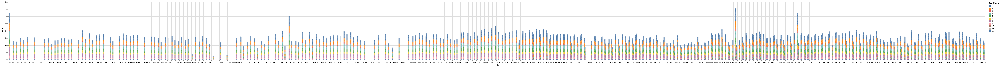

In [53]:
import altair as alt
from altair import pipe, limit_rows, to_values
t = lambda data: pipe(data, limit_rows(max_rows=100000), to_values)
alt.data_transformers.register('custom', t)
alt.data_transformers.enable('custom')

soil_moisture_asc_plot = alt.Chart(soil_moisture_asc.reset_index()).mark_bar().encode(x = 'date:T', y = 'mean:Q', color = 'Soil Class:N').properties(width=5000)
soil_moisture_asc_plot

## Thoughts
Maybe there is no different in sm content there is a different in backscatter behaviour of different soils so it looks like there is sm content difference 

In [ ]:
import panel as pn
import altair as alt
from altair import datum
import pandas as pd
from vega_datasets import data
import datetime as dt

#tells Panel to accept Vega
pn.extension('vega')

#Create a list of scientific quantities/units to choose from
tickers = ['soil moisture', 'precipitation']

#Craete a drop-down widget
ticker = pn.widget.Select(name='scientific quantities', options= tickers)

#Create a date range slider
date_range_slider = pn.widgets.DateRangeSlider(name='Date Range Slider', start=dt.datetime(2014,1,1), end= dt.datetime(2019,6,1), value=(dt.datetime(2014,1,1), dt.datetime(2019.6.1)))

#Add title and subtitle
title = '### Hessisches Ried overview'
subtitle '### This dashboard allows you to select a scientific quantitie and the corresponding daterange'

#Build dashboard 
@pn.depends(ticker.param.value, date_range_slider.param.value)

def get_plot(ticker, date_range):     # Load and format the data
     df = source # define df
     df[‘date’] = pd.to_datetime(df[‘date’])     # create date filter using values from the range slider
     # store the first and last date range slider value in a var
     start_date = date_range_slider.value[0] 
     end_date = date_range_slider.value[1]      # create filter mask for the dataframe
     mask = (df[‘date’] > start_date) & (df[‘date’] <= end_date)
     df = df.loc[mask] # filter the dataframe     # create the Altair chart object
     chart = alt.Chart(df).mark_line().encode(x=’date’, y=‘price’,      tooltip=alt.Tooltip([‘date’,’price’])).transform_filter(
(datum.symbol == ticker) # this ties in the filter 
)     return chart